In [1]:
import sys
sys.path.append("../")

In [2]:
import os 
import glob
import cv2
import matplotlib.pyplot as plt
%matplotlib inline 
import numpy as np
import importlib
import random
import time
from datetime import datetime
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers.schedules import PiecewiseConstantDecay
from tensorflow.keras.layers import Add, Conv2D, Input, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras import backend as K

import tensorflow as tf
from tensorflow.python.client import device_lib
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from tensorflow.compat.v1 import Session
from tensorflow.compat.v1 import get_default_graph

from RESUNET import data_generator as data_generator
from RESUNET import config as config
from EDSR import utils as utils
from EDSR import losses as losses
from RESUNET import models as models
from EDSR import lr_finder as lr_finder
from EDSR import custom_callbacks as custom_callbacks 

seed = 2020
os.environ['PYTHONHASHSEED'] = '0'                      
np.random.seed(seed)
random.seed(seed)
tf.random.set_seed(seed)

session_conf = ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = Session(graph=get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)


In [3]:
importlib.reload(utils)
importlib.reload(data_generator)
importlib.reload(models)
importlib.reload(losses)
 

<module 'EDSR.losses' from '../EDSR/losses.py'>

In [4]:
# crop_size = 96
crop_size = 128
img_path = config.DATA_PATH
batch_size = 32
scale = 2
epochs = 30

img_path_list = sorted(glob.glob(os.path.join(img_path, '*.jpg')))
test_size = 0.2
img_path_idx = np.arange(len(img_path_list))
train_img_path, val_img_path, train_img_idx, val_img_idx = train_test_split(img_path_list, img_path_idx, \
                                                                            test_size=test_size, random_state=2020)
print(len(train_img_idx), len(val_img_idx))  


5912 1478


### train decoder with MAE and perceptual loss

In [6]:
importlib.reload(models)

resnet34_weight = 'resnet34_imagenet_1000_no_top.h5'
resunet = models.ResUNet(input_shape=(None, None, 3), encoder_weights=resnet34_weight, classes=3,
                         decoder_block_type='subpixel_upsampling', batchnorm=True, encoder_freeze=True)

# resunet.summary()

In [7]:
importlib.reload(data_generator)

flip = False
crop = True
keep_dim = True
multi_losses = False

train_gen = data_generator.DataGenerator(img_path_list=train_img_path, crop_size=crop_size, 
                                         batch_size=batch_size, scale=scale, shuffle=True, 
                                         keep_dim=keep_dim, crop=crop, flip=flip,
                                         multi_losses=multi_losses)

val_gen = data_generator.DataGenerator(img_path_list=val_img_path, crop_size=crop_size,
                                       batch_size=batch_size, scale=scale, shuffle=True,
                                       keep_dim=keep_dim, crop=crop, flip=flip,
                                       multi_losses=multi_losses)


Instructions for updating:
Please use Model.fit, which supports generators.
  ...
    to  
  ['...']
Train for 185 steps
Epoch 1/3
185/185 [==============================] - 27s 146ms/step - loss: 0.6470 - SSIM: 0.0075
Epoch 2/3
185/185 [==============================] - 21s 115ms/step - loss: 0.1542 - SSIM: 0.3623
Epoch 3/3
 95/185 [==============>...............] - ETA: 10s - loss: 0.1120 - SSIM: 0.5200

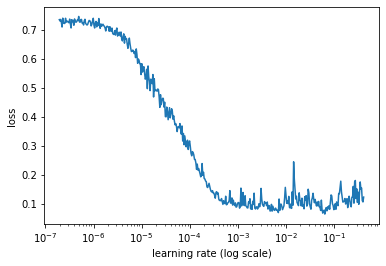

In [8]:

resunet.compile(optimizer=Adam(lr=0.001), loss = 'mae', metrics=[losses.SSIM])
 
lr_finder = lr_finder.LRFinder(resunet)
lr_finder.find_generator(generator=train_gen, start_lr=1e-07, end_lr=10, epochs=3)
lr_finder.plot_loss(n_skip_beginning=20, n_skip_end=5)


### train decoder only with both MAE and perceptual loss from the beginning

In [10]:
importlib.reload(data_generator)

flip = False
crop = True
keep_dim = True
multi_losses = True

train_gen = data_generator.DataGenerator(img_path_list=train_img_path, crop_size=crop_size, 
                                         batch_size=batch_size, scale=scale, shuffle=True, 
                                         keep_dim=keep_dim, crop=crop, flip=flip,
                                         multi_losses=multi_losses)

val_gen = data_generator.DataGenerator(img_path_list=val_img_path, crop_size=crop_size,
                                       batch_size=batch_size, scale=scale, shuffle=True,
                                       keep_dim=keep_dim, crop=crop, flip=flip,
                                       multi_losses=multi_losses)


In [2]:

# [batch_lr_img, batch_hr_img], _ = next(iter(train_gen))
# print(batch_lr_img.shape, batch_hr_img.shape)

# show_num = 3
# for i in range(len(batch_hr_img[:show_num])):
#     utils.show_batch_imgs(idx=i, demo_ori_img=batch_hr_img[:show_num], demo_lr_img=batch_lr_img[:show_num])



In [13]:

HR = Input((crop_size, crop_size, 3), name = 'HR')
LR = Input((crop_size, crop_size, 3), name = 'LR')
SR = resunet(LR)
    
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

vgg = VGG16(include_top=False, weights='imagenet', input_tensor=Lambda(utils.vgg_preprocess_input)(HR))

for l in vgg.layers: 
    l.trainable = False

# get perceptual\content outputs
def get_output(model, layer_name): 
    return model.get_layer('block{}_conv2'.format(layer_name)).output

vgg_content = Model(HR, [get_output(vgg, output) for output in [3, 4, 5]], name = 'VGG16')
vgg1 = vgg_content(HR) # to extract features of HR
vgg2 = vgg_content(SR) # to extract features of SR

# Perceptual Loss
loss_cont = Lambda(losses.content_loss, name = 'Content')(vgg1+vgg2)
model = Model([LR, HR], [SR, loss_cont])
multi_losses = ['unet', 'Content']
weights = [1., 1.]


In [14]:
 
opt = Adam(learning_rate=PiecewiseConstantDecay(boundaries=[len(train_gen)*10, len(train_gen)*20], 
                                                values=[1e-3, 5e-4, 1e-5]))

checkpoint = ModelCheckpoint(filepath = 'resunet_multi_loss_x{}_128_crop.h5'.format(scale), 
                               save_best_only=True, save_weights_only=True,
                               monitor = 'val_loss')

model.compile(optimizer=opt, loss = {loss : 'mae' for loss in multi_losses}, 
              loss_weights = weights, metrics={'unet' : losses.SSIM})
 

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
LR (InputLayer)                 [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
unet (Model)                    multiple             29959068    LR[0][0]                         
__________________________________________________________________________________________________
HR (InputLayer)                 [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
VGG16 (Model)                   [(None, 32, 32, 256) 12354880    HR[0][0]                         
                                                                 unet[1][0]                 

In [15]:

log_filename = datetime.now().strftime("%Y-%m-%d_%H:%M:%S") + 'resunet_multi_loss_128_crop.log'
log_path = os.path.join('/work/logs', log_filename) 
csv_logger = CSVLogger(log_path, separator=',', append=False)

callbacks_list = [checkpoint, csv_logger]
model.fit(train_gen, validation_data=val_gen, callbacks=callbacks_list, epochs=epochs)


Train for 185 steps, validate for 47 steps
Epoch 1/30
185/185 [==============================] - 51s 274ms/step - loss: 2.0831 - unet_loss: 0.1647 - Content_loss: 1.9184 - unet_SSIM: 0.4431 - val_loss: 3.3569 - val_unet_loss: 0.2273 - val_Content_loss: 3.1295 - val_unet_SSIM: 0.3280
Epoch 2/30
185/185 [==============================] - 40s 218ms/step - loss: 1.0355 - unet_loss: 0.0612 - Content_loss: 0.9743 - unet_SSIM: 0.7044 - val_loss: 3.2710 - val_unet_loss: 0.2185 - val_Content_loss: 3.0525 - val_unet_SSIM: 0.3489
Epoch 3/30
185/185 [==============================] - 40s 218ms/step - loss: 0.9662 - unet_loss: 0.0577 - Content_loss: 0.9085 - unet_SSIM: 0.7385 - val_loss: 3.1837 - val_unet_loss: 0.2137 - val_Content_loss: 2.9701 - val_unet_SSIM: 0.3869
Epoch 4/30
185/185 [==============================] - 40s 218ms/step - loss: 0.8854 - unet_loss: 0.0515 - Content_loss: 0.8339 - unet_SSIM: 0.7619 - val_loss: 2.8757 - val_unet_loss: 0.1877 - val_Content_loss: 2.6880 - val_unet_SSIM: 

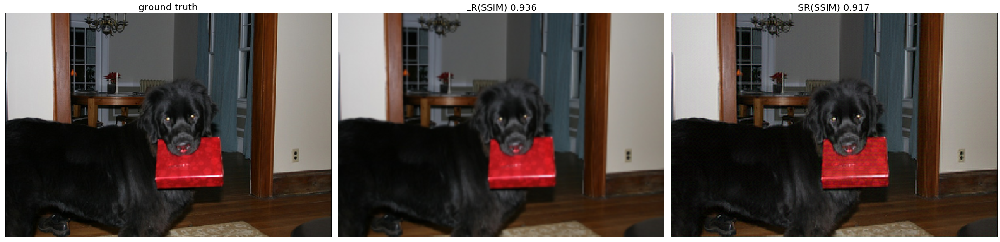

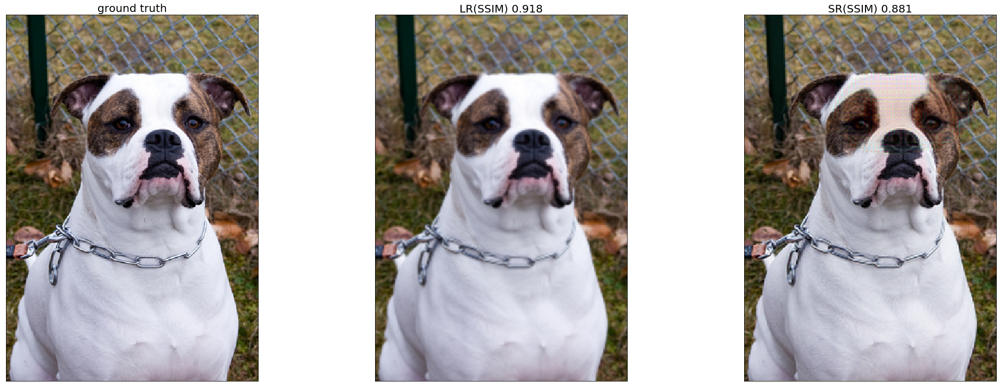

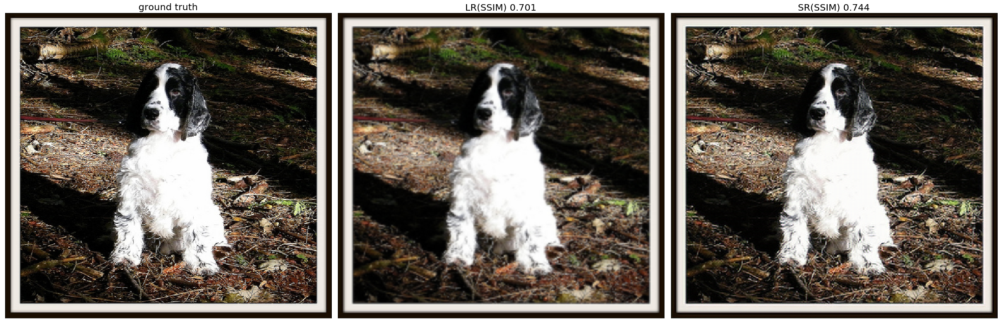

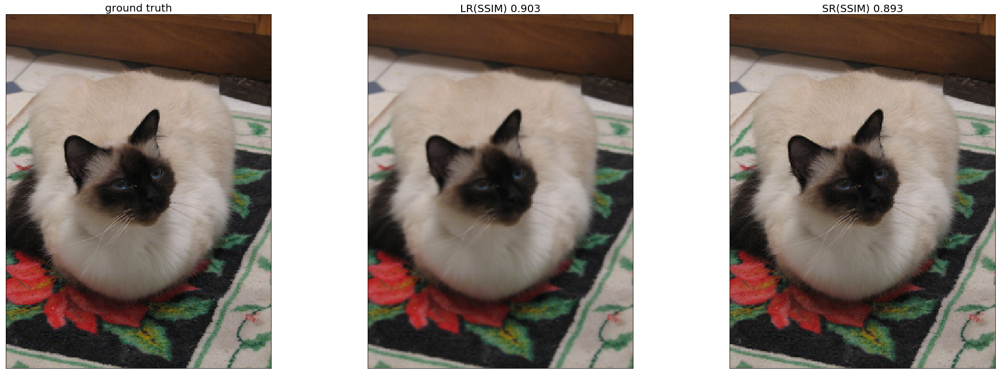

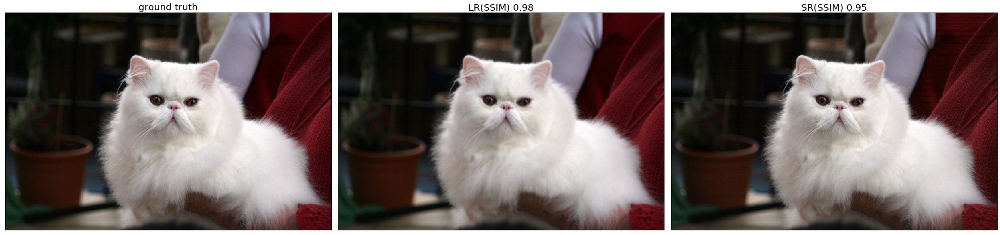

In [16]:
resunet.save_weights('resunet_multilosses_128_crop.h5')
resunet = models.ResUNet(input_shape=(None, None, 3), encoder_weights=resnet34_weight, classes=3,
                         decoder_block_type='subpixel_upsampling', batchnorm=True, encoder_freeze=True)

resunet.load_weights("resunet_multilosses_128_crop.h5")

utils.predict_and_show(val_img_path[:5], resunet, 2, keep_dim = True, multi_255 = True)


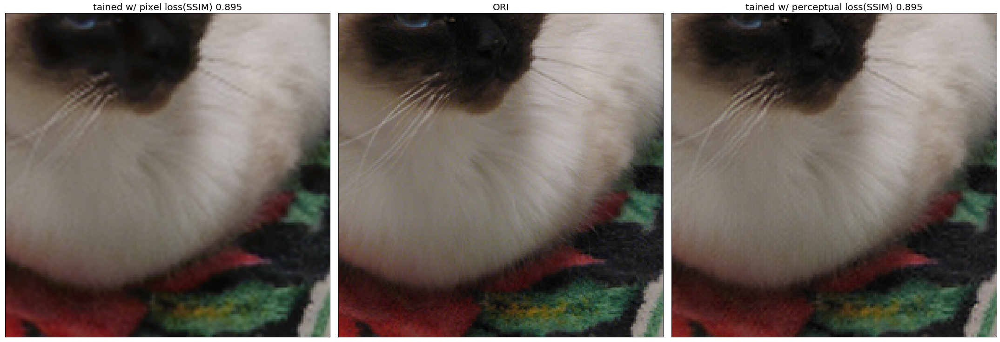

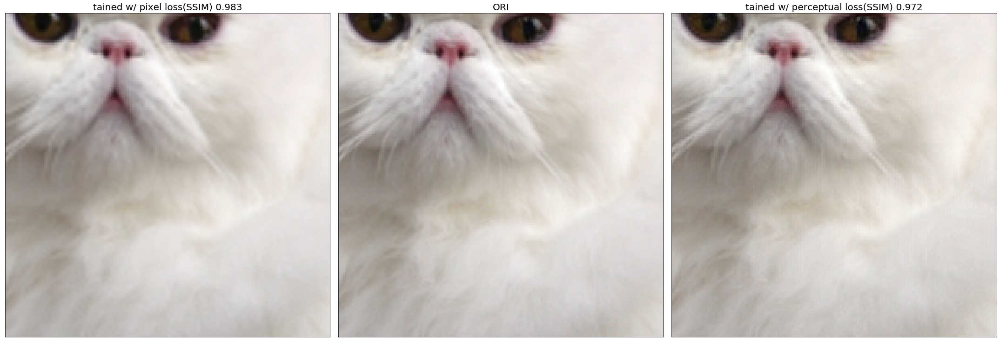

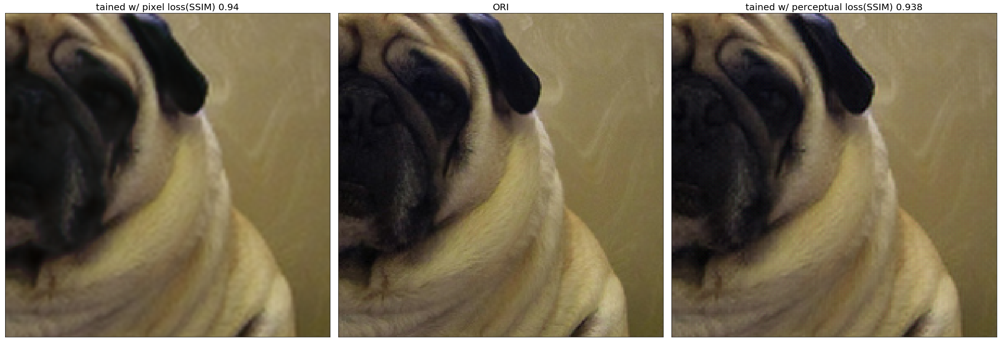

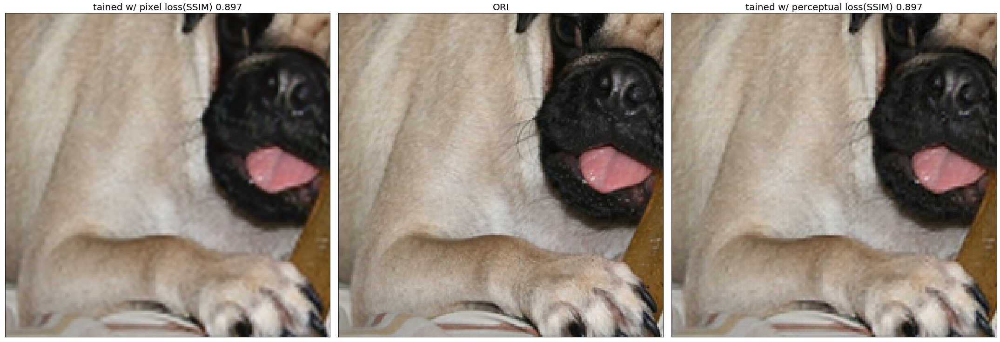

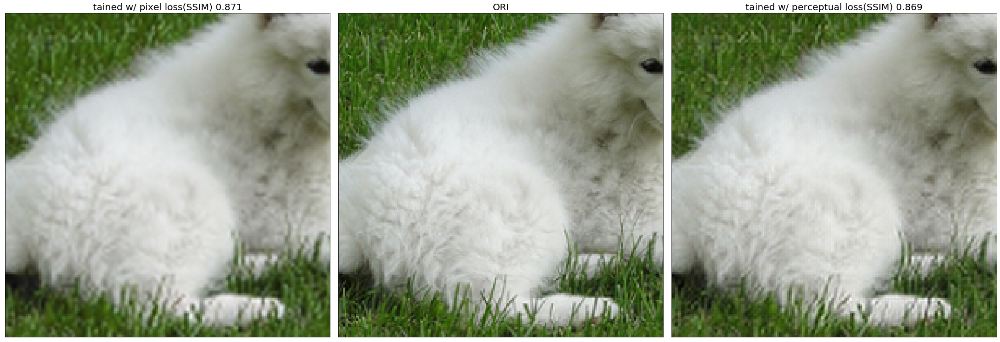

In [26]:
importlib.reload(utils)

# trained only the decoder with MAE loss alone
model1 =  models.ResUNet(input_shape=(None, None, 3), encoder_weights=resnet34_weight, classes=3,
                         decoder_block_type='upsampling', batchnorm=True, encoder_freeze=True)

# ../model/ResUnet_MAE_lr_batch32.h5
# resunet_finetuned_multilosses.h5
model1.load_weights('../model/ResUnet_MAE_lr_batch32.h5')

# trained only the decoder (subpixel upsampling) with MAE and perceptual loss 
model2 = models.ResUNet(input_shape=(None, None, 3), encoder_weights=resnet34_weight, classes=3,
                         decoder_block_type='subpixel_upsampling', batchnorm=True, encoder_freeze=True)


# counterpart trained with crop size 96: resunet_multilosses
model2.load_weights("resunet_multilosses_128_crop.h5")

utils.compare_two_models(val_img_path[3:8], model1, model2, scale, keep_dim=True, 
                         show_ori_img=True, multi_255=True, show_patch=True)
